In [1]:
! pip install pyedflib
! pip install numpy
! pip install matplotlib
! pip install statistics


[notice] A new release of pip is available: 23.2.1 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached statistics-1.0.3.5-py3-none-any.whl



[notice] A new release of pip is available: 23.2.1 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
from pyedflib import highlevel
import pyedflib as plib
import numpy as np
import matplotlib.pyplot as plt
import statistics as stat

def read_file_signal(file_path, index):
    f = plib.EdfReader(file_path)
    signal = f.readSignal(index)
    f.close()
    return signal

def signal_labels(file_path):
    f = plib.EdfReader(file_path)
    labels = f.getSignalLabels()
    f.close()
    return labels

def combined_signal(file_list, index):
    combined_signals = []
    for file in file_list:
        temp = read_file_signal(file, index)
        combined_signals.append(temp)
    return np.concatenate(combined_signals)

edf_files_severe = [
    "c:\\Users\\anany\\Downloads\\00000349-297469[001].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[002].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[003].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[004].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[005].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[006].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[007].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[008].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[009].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[010].edf"
]

labels = signal_labels(edf_files_severe[0])
labels[16] = "Flow patient 1"
labels[17] = "Flow patient 2"
labels[23] = "Flow patient 3"
print(labels)

['EEG F3-A2', 'EEG F4-A1', 'EEG A1-A2', 'EEG C3-A2', 'EEG C4-A1', 'EEG O1-A2', 'EEG O2-A1', 'EOG LOC-A2', 'EOG ROC-A1', 'EMG Chin', 'Leg 1', 'Leg 2', 'ECG I', 'RR', 'ECG II', 'Snore', 'Flow patient 1', 'Flow patient 2', 'Effort THO', 'Effort ABD', 'SpO2', 'Pleth', 'Body', 'Flow patient 3', 'xPAP CPAP', 'xPAP IPAP', 'xPAP EPAP', 'Leak Total', 'PulseRate', 'PressCheck', 'ECG IIHF', 'Technical']


In [6]:
def plot_signal(label, signal):
    plt.figure(figsize=(20, 10))
    plt.plot(signal)
    plt.title(f"{label} signal")
    plt.xlabel("time")
    plt.ylabel("amplitude")
    # plt.ylim(-300, 300)
    plt.show()

def thresholding(signal, threshold):
    mean = signal.mean()
    std = np.std(signal)
    lower_limit = mean - threshold * std
    upper_limit = mean + threshold * std
    filtered_signal = np.where((signal >= lower_limit) & (signal <= upper_limit), signal, mean)
    return filtered_signal

def resample_signal(signal, num_samples):
    original_indices = np.linspace(0, len(signal) - 1, num=len(signal))
    resampled_indices = np.linspace(0, len(signal) - 1, num=num_samples)
    resampled_signal = np.interp(resampled_indices, original_indices, signal)
    return resampled_signal

def mean_of_interval(signal, start, end):
    return stat.mean(signal[start:end])

# HOUR 1

In [5]:
! pip install hmmlearn

  Obtaining dependency information for hmmlearn from https://files.pythonhosted.org/packages/c8/5f/65b892737fed694b23a753b516cd851d21963abd33ea86123723f6279987/hmmlearn-0.3.3-cp311-cp311-win_amd64.whl.metadata
Using cached hmmlearn-0.3.3-cp311-cp311-win_amd64.whl (127 kB)



[notice] A new release of pip is available: 23.2.1 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
from hmmlearn.hmm import GaussianHMM

def train_hmm(signal, states, iterations):
    data = signal.reshape(-1, 1)
    model = GaussianHMM(n_components=states, covariance_type="full", n_iter=iterations, random_state=42)
    model.fit(data)
    hidden_states = model.predict(data)
    return hidden_states    

def plot_hidden_states(hidden_states):
    plt.figure(figsize=(20, 10))
    plt.plot(hidden_states, label='Hidden States', linewidth=1, linestyle='--')   
    plt.title("Hidden states")
    plt.xlabel("time")
    plt.ylabel("amplitude")
    plt.show()

def plot_signal_hidden_states(signal, hidden_states):
    data = signal.reshape(-1, 1)
    plt.figure(figsize=(20, 10))
    for i in range(data.shape[1]):  
        plt.plot(data[:, i], label=f'Channel {i+1}')
    plt.plot(hidden_states, label='Hidden States', linestyle='--', linewidth=2)  
    plt.title("Signal with Hidden states")
    plt.xlabel("time")
    plt.ylabel("amplitude")
    plt.show()

In [8]:
from sklearn.preprocessing import StandardScaler

def train_hmm_multichannel(signal, states, iterations):
    data_normalized = StandardScaler().fit_transform(signal)
    model = GaussianHMM(n_components=states, covariance_type="full", n_iter=iterations, random_state=42)
    model.fit(data_normalized)
    hidden_states = model.predict(data_normalized)
    return hidden_states

In [9]:
def process_signal(index, file_path):
    signal = read_file_signal(file_path, index)
    resampled_signal = resample_signal(signal, 3600)
    denoised_signal = thresholding(resampled_signal, 3)
    return denoised_signal

# training on individual channels

In [10]:
hidden_states_list = []

for i in range(32):
    signal = process_signal(i, edf_files_severe[0])
    print(labels[i])
    hidden_states = train_hmm(signal, 2, 1000)
    hidden_states_list.append(hidden_states)

print(hidden_states_list)

EEG F3-A2
EEG F4-A1
EEG A1-A2
EEG C3-A2
EEG C4-A1
EEG O1-A2
EEG O2-A1
EOG LOC-A2
EOG ROC-A1
EMG Chin
Leg 1
Leg 2
ECG I
RR


Model is not converging.  Current: 9950.800544354912 is not greater than 9951.553707484958. Delta is -0.7531631300462323


ECG II
Snore
Flow patient 1
Flow patient 2
Effort THO
Effort ABD
SpO2
Pleth
Body
Flow patient 3
xPAP CPAP
xPAP IPAP


c:\Users\anany\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:1151: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
c:\Users\anany\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:1151: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
c:\Users\anany\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:1151: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


xPAP EPAP
Leak Total
PulseRate


c:\Users\anany\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:1151: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
c:\Users\anany\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:1151: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


PressCheck


c:\Users\anany\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:1151: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


ECG IIHF
Technical
[array([0, 0, 1, ..., 0, 0, 1], dtype=int64), array([1, 1, 1, ..., 0, 0, 0], dtype=int64), array([1, 1, 0, ..., 0, 0, 1], dtype=int64), array([1, 1, 1, ..., 1, 0, 0], dtype=int64), array([1, 1, 1, ..., 0, 0, 0], dtype=int64), array([0, 0, 1, ..., 0, 0, 0], dtype=int64), array([1, 1, 1, ..., 0, 0, 0], dtype=int64), array([0, 0, 0, ..., 0, 0, 0], dtype=int64), array([1, 1, 1, ..., 0, 0, 0], dtype=int64), array([1, 1, 1, ..., 1, 1, 1], dtype=int64), array([1, 0, 0, ..., 0, 0, 0], dtype=int64), array([0, 0, 0, ..., 0, 0, 0], dtype=int64), array([0, 0, 0, ..., 0, 0, 0], dtype=int64), array([1, 0, 0, ..., 0, 0, 0], dtype=int64), array([1, 1, 1, ..., 0, 0, 0], dtype=int64), array([0, 1, 0, ..., 1, 0, 1], dtype=int64), array([0, 0, 0, ..., 0, 0, 0], dtype=int64), array([1, 0, 0, ..., 1, 1, 1], dtype=int64), array([0, 1, 0, ..., 0, 1, 0], dtype=int64), array([0, 0, 0, ..., 0, 0, 0], dtype=int64), array([0, 0, 0, ..., 1, 1, 1], dtype=int64), array([1, 1, 1, ..., 1, 1, 1], dtyp

In [11]:
for i in range(32):
    print(hidden_states_list[i])

[0 0 1 ... 0 0 1]
[1 1 1 ... 0 0 0]
[1 1 0 ... 0 0 1]
[1 1 1 ... 1 0 0]
[1 1 1 ... 0 0 0]
[0 0 1 ... 0 0 0]
[1 1 1 ... 0 0 0]
[0 0 0 ... 0 0 0]
[1 1 1 ... 0 0 0]
[1 1 1 ... 1 1 1]
[1 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[1 0 0 ... 0 0 0]
[1 1 1 ... 0 0 0]
[0 1 0 ... 1 0 1]
[0 0 0 ... 0 0 0]
[1 0 0 ... 1 1 1]
[0 1 0 ... 0 1 0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 1 1 1]
[1 1 1 ... 1 1 1]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[0 0 0 ... 0 0 0]
[0 0 1 ... 0 0 0]
[0 0 0 ... 1 1 1]


In [12]:
print(len(hidden_states_list))
print(len(hidden_states_list[0]))

32
3600


Model is not converging.  Current: 9950.800544354912 is not greater than 9951.553707484958. Delta is -0.7531631300462323


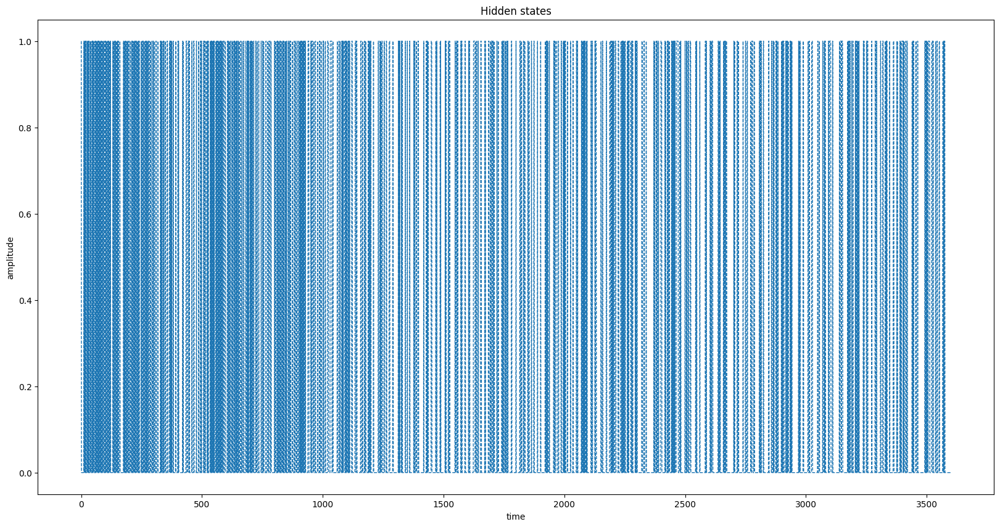

In [26]:
index = labels.index("RR")
signal_rr = process_signal(index, edf_files_severe[0])
hidden_states_rr = train_hmm(signal_rr, 2, 1000)
plot_hidden_states(hidden_states_rr)

# individual analysis

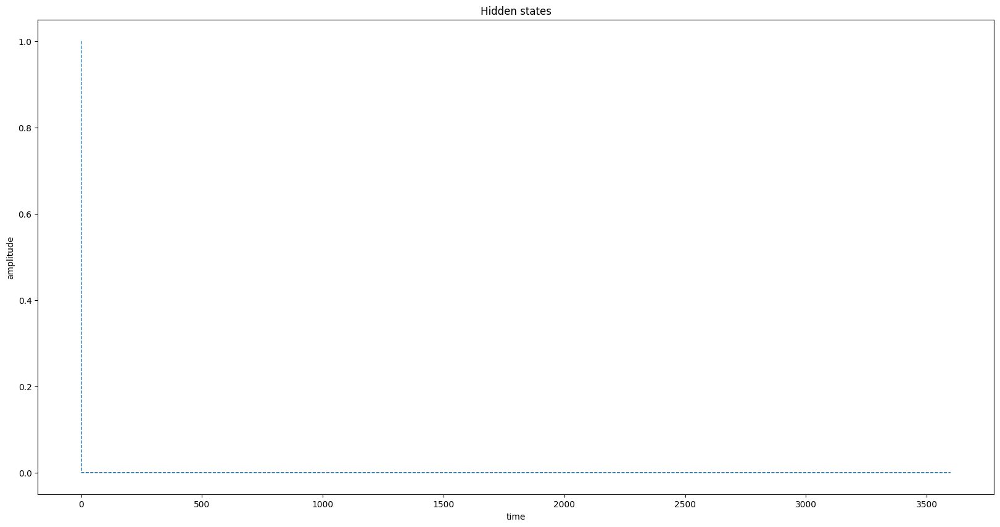

In [44]:
index = labels.index("Leg 1")
signal_rr = process_signal(index, edf_files_severe[0])
hidden_states_rr = train_hmm(signal_rr, 2, 1000)
plot_hidden_states(hidden_states_rr)

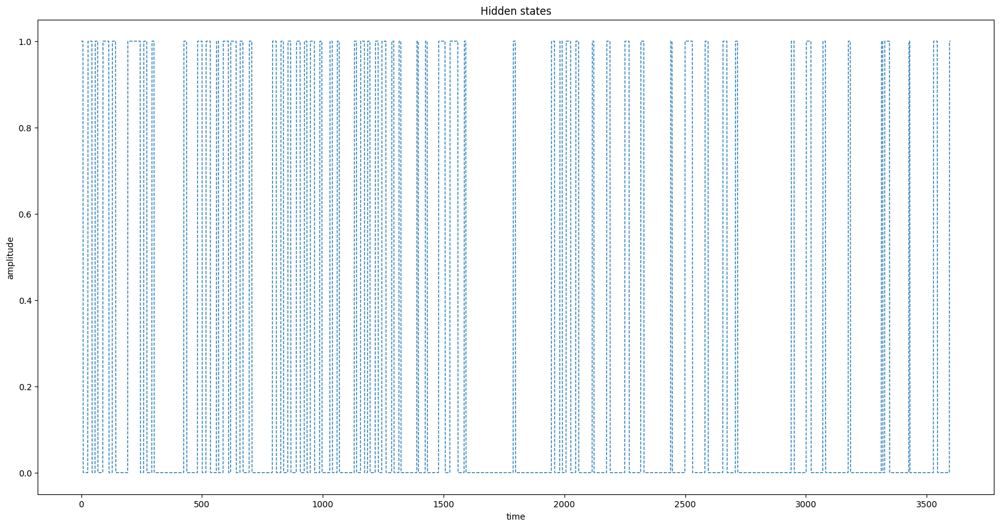

In [88]:
index = labels.index("Leg 2")
signal_rr = process_signal(index, edf_files_severe[0])
hidden_states_rr = train_hmm(signal_rr, 2, 1000)
plot_hidden_states(hidden_states_rr)

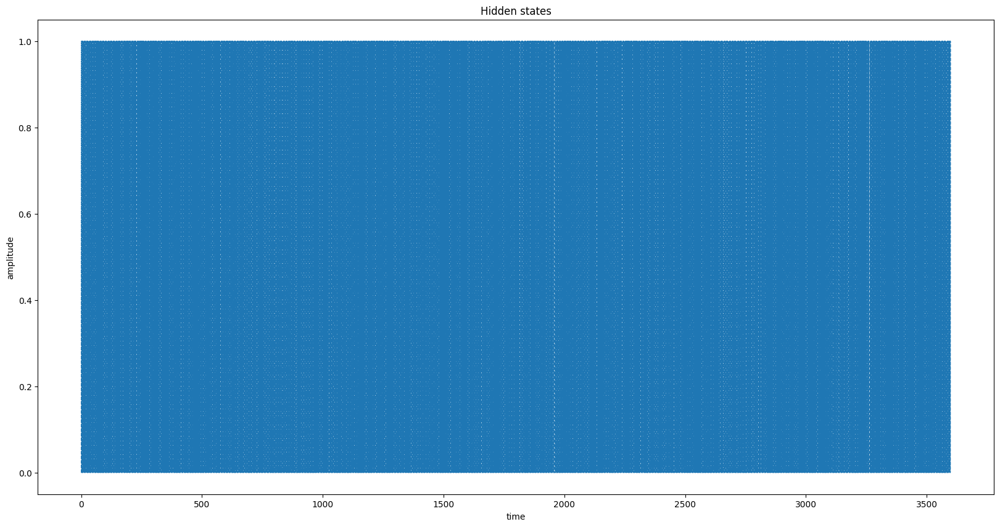

In [33]:
index = labels.index("Snore")
signal_rr = process_signal(index, edf_files_severe[0])
hidden_states_rr = train_hmm(signal_rr, 2, 1000)
plot_hidden_states(hidden_states_rr)

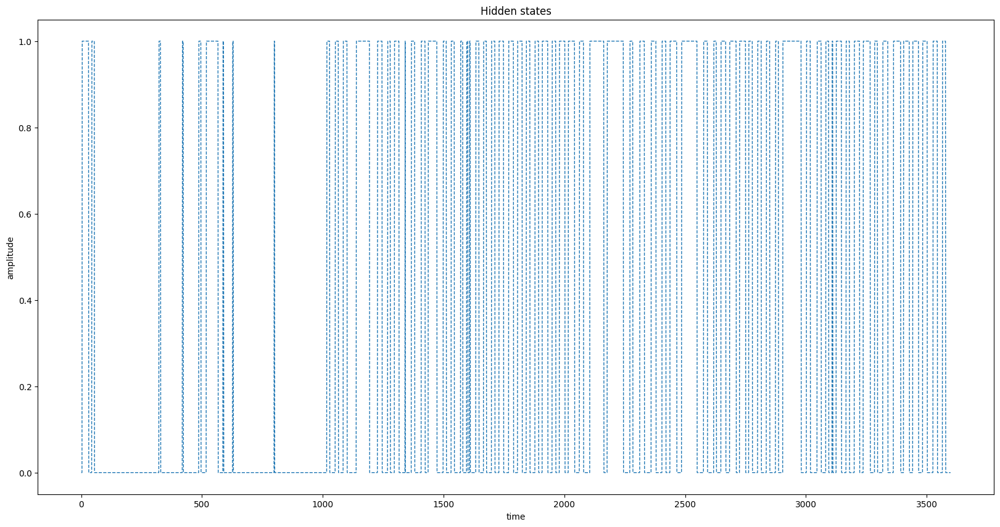

In [20]:
index = labels.index("Effort ABD")
signal_rr = process_signal(index, edf_files_severe[0])
hidden_states_rr = train_hmm(signal_rr, 2, 1000)
plot_hidden_states(hidden_states_rr)

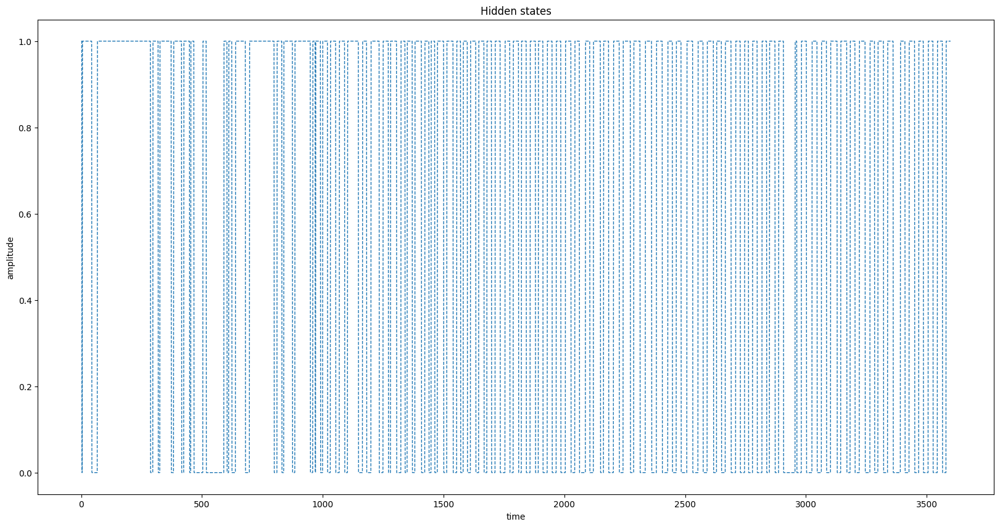

In [99]:
index = labels.index("Effort THO")
signal_rr = process_signal(index, edf_files_severe[0])
hidden_states_rr = train_hmm(signal_rr, 2, 1000)
plot_hidden_states(hidden_states_rr)

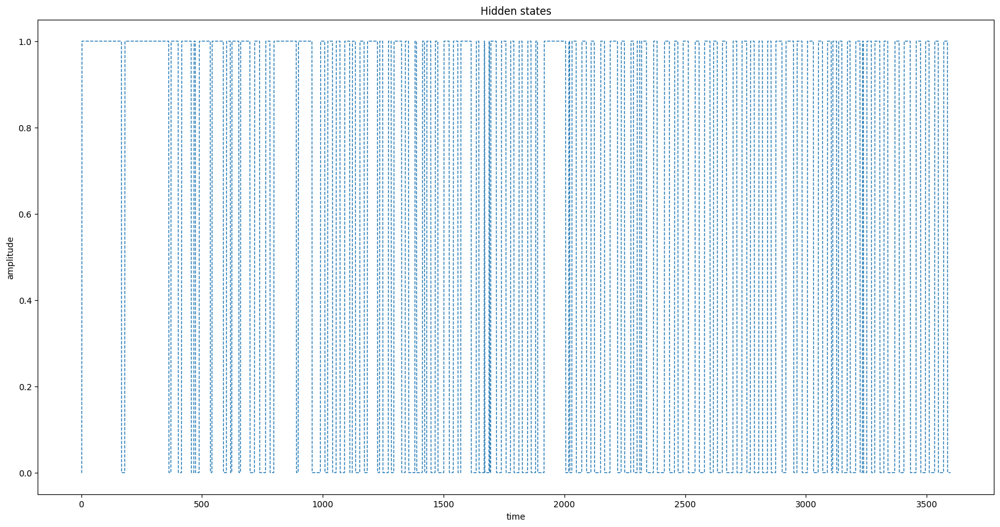

In [102]:
index = labels.index("Flow patient 1")
signal_rr = process_signal(index, edf_files_severe[0])
hidden_states_rr = train_hmm(signal_rr, 2, 1000)
plot_hidden_states(hidden_states_rr)

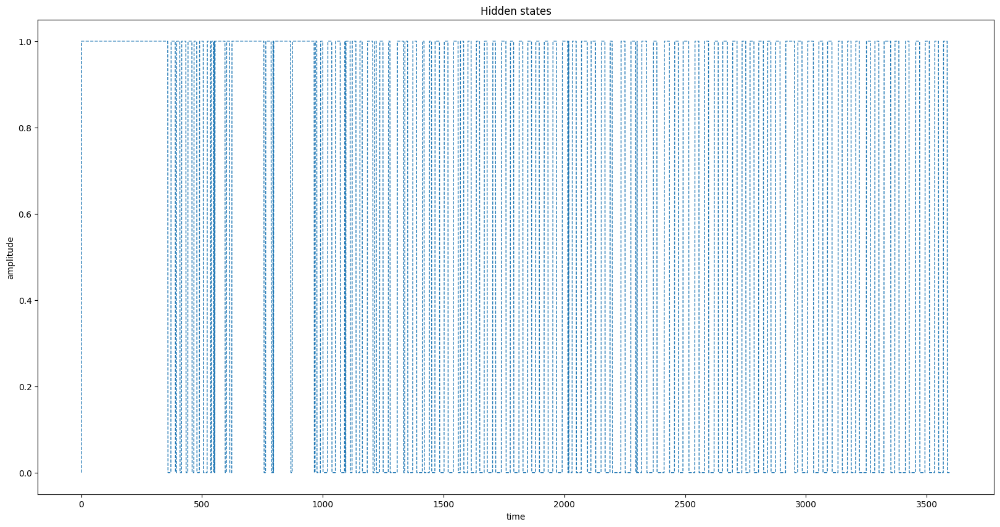

In [103]:
index = labels.index("Flow patient 2")
signal_rr = process_signal(index, edf_files_severe[0])
hidden_states_rr = train_hmm(signal_rr, 2, 1000)
plot_hidden_states(hidden_states_rr)

# training on the 7 identified channels

In [35]:
sleep_staging_list = ["Leg 1", "Leg 2", "Snore", "Effort ABD", "Effort THO", "Flow patient 1", "Flow patient 2"]

combined_signals_2d = []
for i in range(len(sleep_staging_list)):
    index = labels.index(sleep_staging_list[i])
    signal = process_signal(index, edf_files_severe[0])
    combined_signals_2d.append(signal)

final_1 = np.array(combined_signals_2d).T
print(final_1.shape)
print(final_1)

(3600, 7)
[[ 1.19020371e-03  1.19020371e-03  1.52590219e-03 ...  1.52590219e-03
   1.52590219e-03  1.52590219e-03]
 [ 9.61029504e+00  2.91913416e-01  5.46167413e-01 ... -1.89304497e-02
   2.78321690e-03 -1.00000000e+02]
 [-1.19713295e+00  8.99138879e-01 -1.03320622e+00 ... -1.89304497e-02
   2.78321690e-03 -1.00000000e+02]
 ...
 [ 2.42116040e+00  7.65799025e-01  1.65730615e-01 ...  3.17401011e+00
  -6.18326179e-01 -2.67600295e+00]
 [ 5.87889563e+00  7.36938122e+00  5.15577293e-01 ... -1.44200725e+00
  -2.36766683e-01 -3.75829709e+00]
 [ 2.43872740e+00  1.98168917e+00  4.59296559e-01 ... -1.18867781e+00
   2.63981079e-01 -2.45212482e+00]]


[0 1 1 ... 0 0 0]


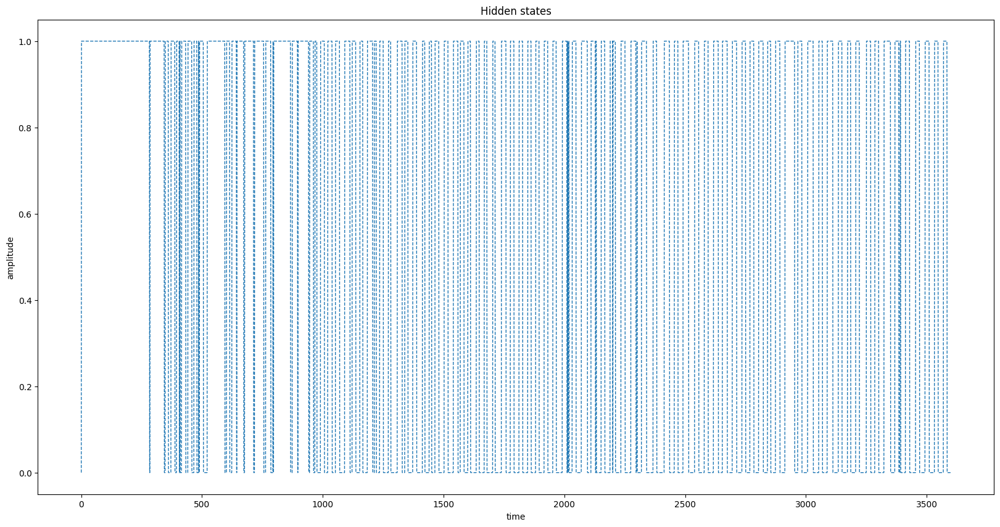

In [36]:
hidden_states_ss = train_hmm_multichannel(final_1, 2, 1000)
print(hidden_states_ss)
plot_hidden_states(hidden_states_ss)

# training on all 32 channels

In [37]:
combined_signals_2d = []
for i in range(32):
    signal = process_signal(index, edf_files_severe[0])
    combined_signals_2d.append(signal)

final_2 = np.array(combined_signals_2d).T
print(final_2.shape)

(3600, 32)


[1 0 0 ... 1 1 1]


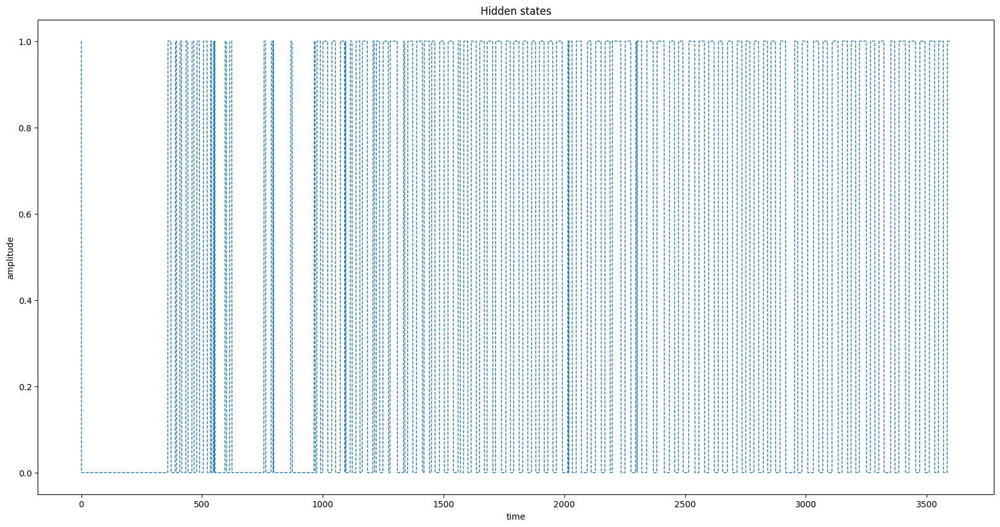

In [38]:
hidden_states_32 = train_hmm_multichannel(final_2, 2, 1000)
print(hidden_states_32)
plot_hidden_states(hidden_states_32)

# training on widely used channels
EEG, EOG, EMG

In [41]:
channels = ['EEG F3-A2', 'EEG F4-A1', 'EEG A1-A2', 'EEG C3-A2', 'EEG C4-A1', 'EEG O1-A2', 'EEG O2-A1', 'EOG LOC-A2', 'EOG ROC-A1', 'EMG Chin']
combined_signals_2d = []
for i in range(len(channels)):
    index = labels.index(channels[i])
    signal = process_signal(index, edf_files_severe[0])
    combined_signals_2d.append(signal)

final_3 = np.array(combined_signals_2d).T
print(final_3.shape)

(3600, 10)


In [122]:
print(final_3)

[[ 4.77607385e-03  4.77607385e-03  4.77607385e-03 ...  4.77607385e-03
   4.77607385e-03  1.19020371e-03]
 [-3.87579786e+00  1.38200121e+02 -1.98207065e+00 ...  2.70776581e+00
   1.17125159e+02  2.25118360e+01]
 [-6.46233514e+01  5.05278078e+01  8.37275340e-01 ... -5.15532650e+00
  -5.09675012e+01 -1.27963034e+01]
 ...
 [ 5.83082710e+00  3.26922627e+01  7.35145125e-01 ...  2.53583790e+01
  -8.25044530e+00 -1.59241600e+01]
 [ 2.70641872e+01 -1.07943157e+01  1.17674683e+00 ...  2.16720091e+01
  -5.58558228e+01 -5.96596322e+01]
 [ 7.76446326e+01  3.82563516e+00 -7.59395743e-01 ...  2.59866178e+01
   1.53311971e+00  8.07553216e+00]]


[0 1 1 ... 1 1 1]


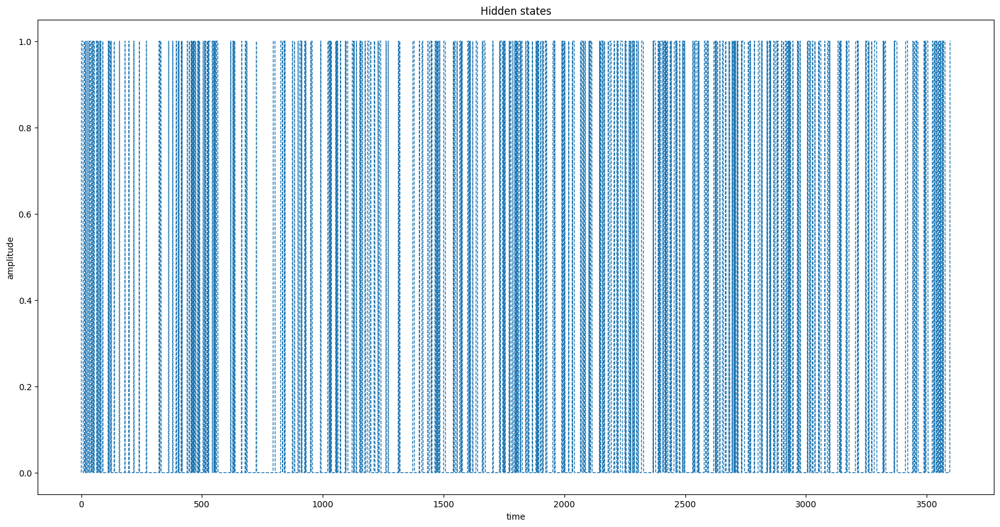

In [123]:
hidden_states_lit = train_hmm_multichannel(final_3, 2, 1000)
print(hidden_states_lit)
plot_hidden_states(hidden_states_lit)

# finding correlation between hidden states of each channel

In [108]:
! pip install seaborn
! pip install scipy


[notice] A new release of pip is available: 23.2.1 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


c:\Users\anany\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


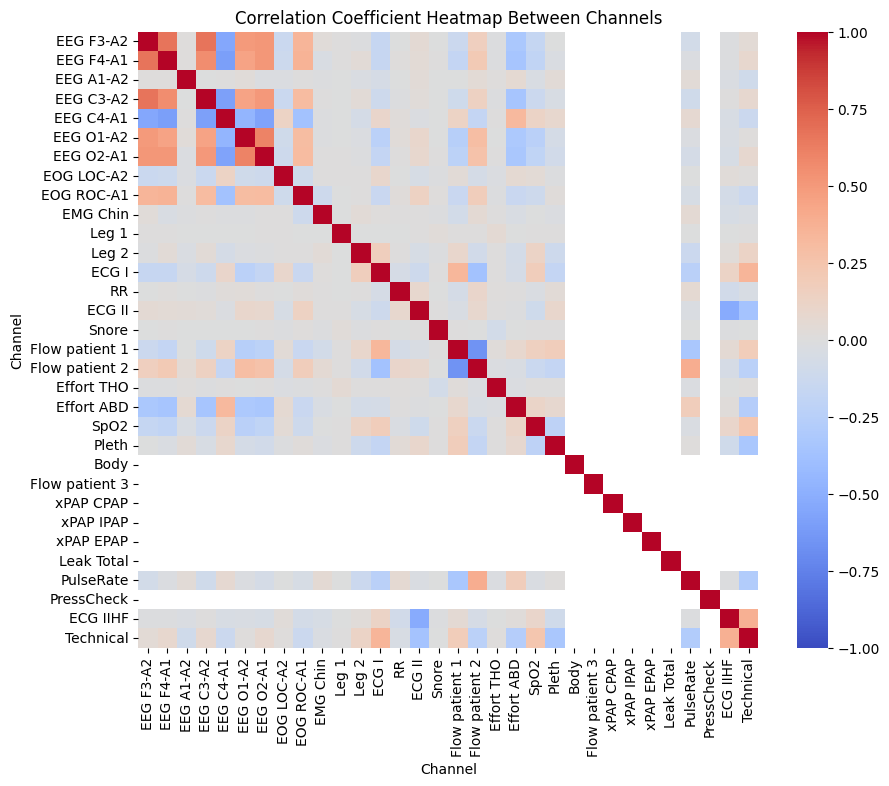

In [114]:
import seaborn as sns
from scipy.stats import pearsonr

n_channels = len(hidden_states_list)
correlation_matrix = np.zeros((n_channels, n_channels))

for i in range(n_channels):
    for j in range(n_channels):
        if i != j:  # Avoid self-correlation (will always be 1)
            correlation_matrix[i, j] = pearsonr(hidden_states_list[i], hidden_states_list[j])[0]
        else:
            correlation_matrix[i, j] = 1.0  # Perfect correlation for diagonal

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrix, 
    annot=False, 
    cmap="coolwarm", 
    xticklabels=[f"{labels[i]}" for i in range(n_channels)],
    yticklabels=[f"{labels[i]}" for i in range(n_channels)],
    vmin=-1, vmax=1  # Correlation ranges from -1 to 1
)
plt.title("Correlation Coefficient Heatmap Between Channels")
plt.xlabel("Channel")
plt.ylabel("Channel")
plt.show()

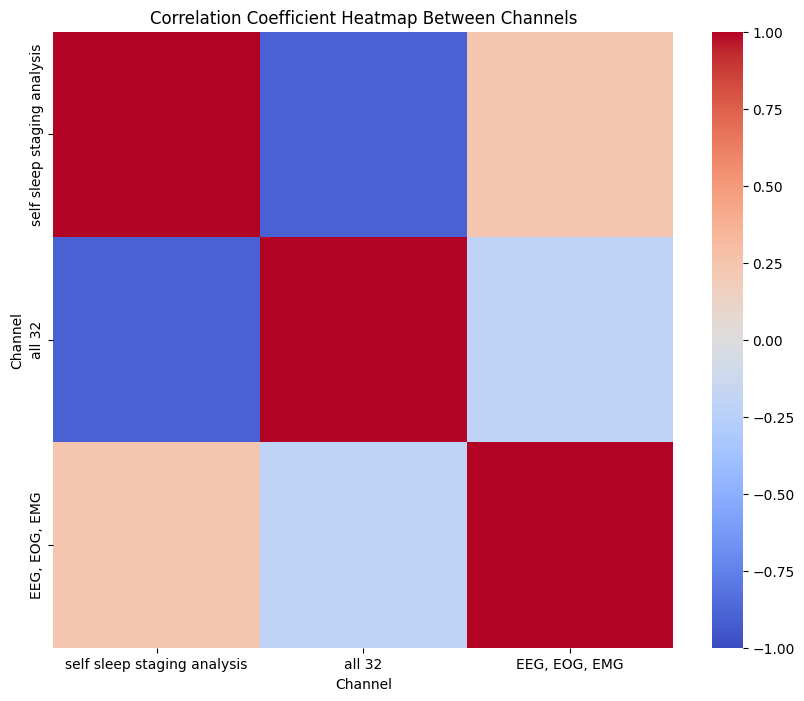

In [124]:
hidden_states_list_2 = [hidden_states_ss, hidden_states_32, hidden_states_lit]
hm_labels = ["self sleep staging analysis", "all 32", "EEG, EOG, EMG"]
n_channels = len(hidden_states_list_2)
correlation_matrix = np.zeros((n_channels, n_channels))

for i in range(n_channels):
    for j in range(n_channels):
        if i != j:  # Avoid self-correlation (will always be 1)
            correlation_matrix[i, j] = pearsonr(hidden_states_list_2[i], hidden_states_list_2[j])[0]
        else:
            correlation_matrix[i, j] = 1.0  # Perfect correlation for diagonal

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrix, 
    annot=False, 
    cmap="coolwarm", 
    xticklabels=hm_labels,
    yticklabels=hm_labels,
    vmin=-1, vmax=1  # Correlation ranges from -1 to 1
)
plt.title("Correlation Coefficient Heatmap Between Channels")
plt.xlabel("Channel")
plt.ylabel("Channel")
plt.show()

[1 4 4 ... 0 1 0]


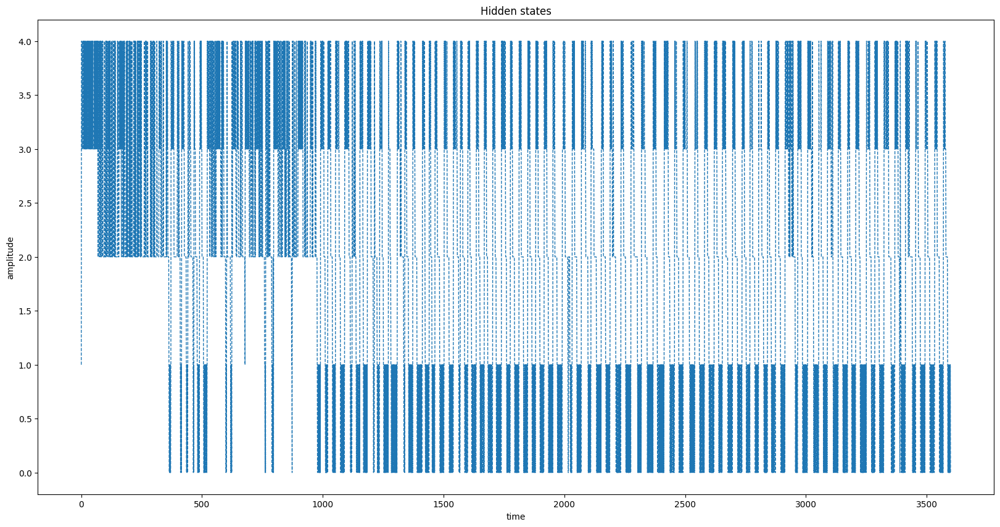

In [39]:
hidden_states_ss_5 = train_hmm_multichannel(final_1, 5, 1000)
print(hidden_states_ss_5)
plot_hidden_states(hidden_states_ss_5)

[3 2 2 ... 3 3 3]


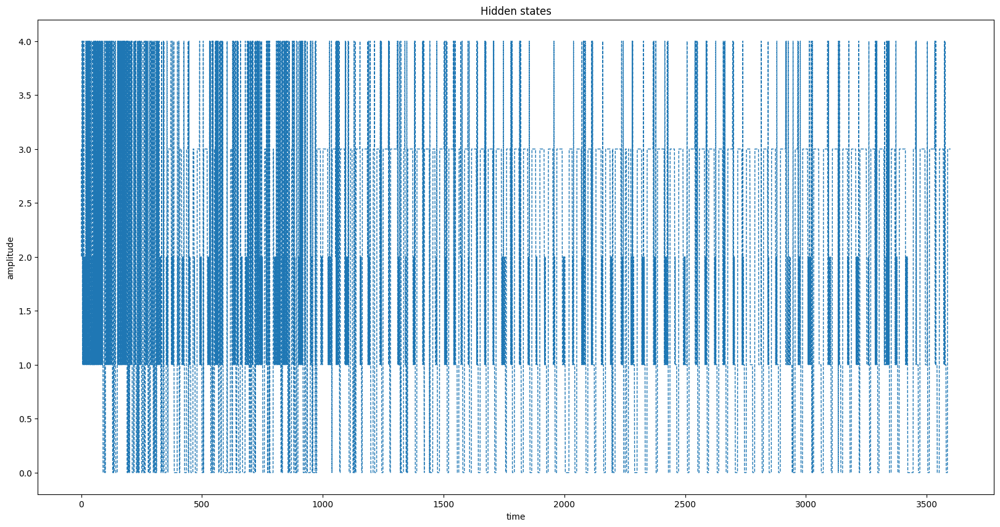

In [126]:
hidden_states_32_5 = train_hmm_multichannel(final_2, 5, 1000)
print(hidden_states_32_5)
plot_hidden_states(hidden_states_32_5)

[0 4 4 ... 3 3 3]


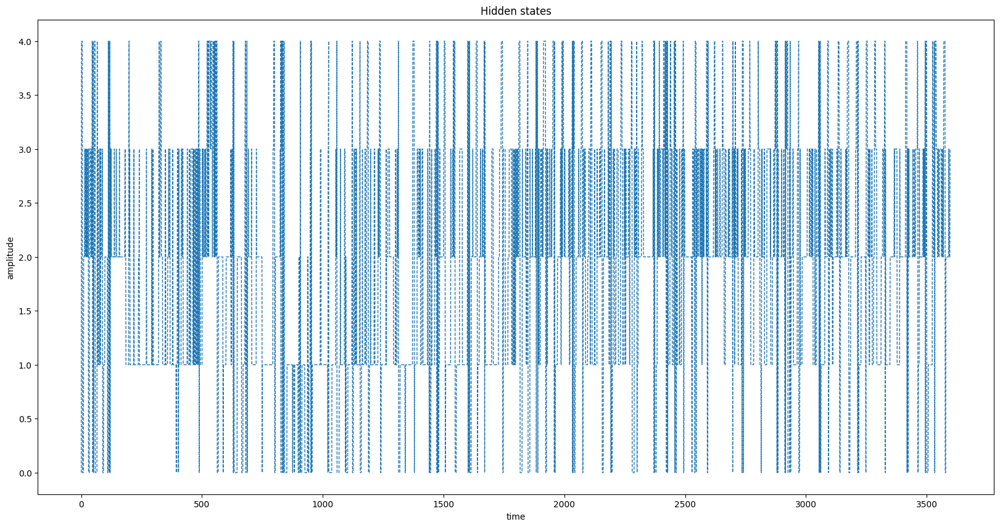

In [42]:
hidden_states_lit_5 = train_hmm_multichannel(final_3, 5, 1000)
print(hidden_states_lit_5)
plot_hidden_states(hidden_states_lit_5)